<a href="https://colab.research.google.com/github/Baazigar007/Visualisations-Opencv/blob/master/Visualisations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Some Commmon Visualisation Techniques and their implementation :






####Importing required libraries and uploading the image.




In [ ]:
import cv2
import os
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import time
!pip install rasterio
import rasterio
from google.colab.patches import cv2_imshow

In [139]:
from google.colab import files
files.upload()

{}

####Now that the image has been uploaded, we can use any library to open it - opencv, matplotlib and even rasterio. I'll open it once using rasterio, and then during the whole project, we will use opencv. (Rasterio is mostly used to study geotransform data image rasters) 


/usr/local/lib/python3.6/dist-packages/rasterio/__init__.py:218: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


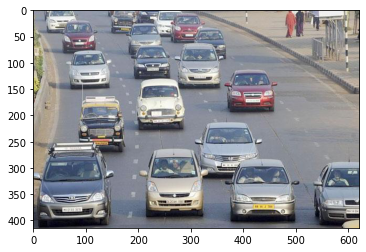

In [23]:
src = rasterio.open("/content/Traffic.jpg")
from rasterio.plot import show
show(src)

####With Opencv , and image can be opened into three modes:-
####0 : Greyscale Mode
####1 : Color mode (we neglect the alpha channel here which gives us an idea about transparency)
####-1 : Includes alpha channel 

#### Since this image does not have any alpha channel , we will open it in normal mode.

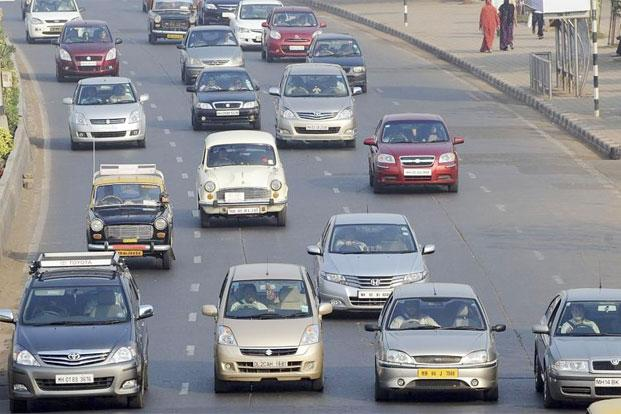

In [30]:
src = cv2.imread("/content/Traffic.jpg",1) 
cv2_imshow(src)

####Before moving on to the various visualisations of an image, we need to pass the image signal low pass filters and medium pass filters, to remove various kind of noises that might have entered because of various reasons.

#####Blurring the image a little to remove noise.




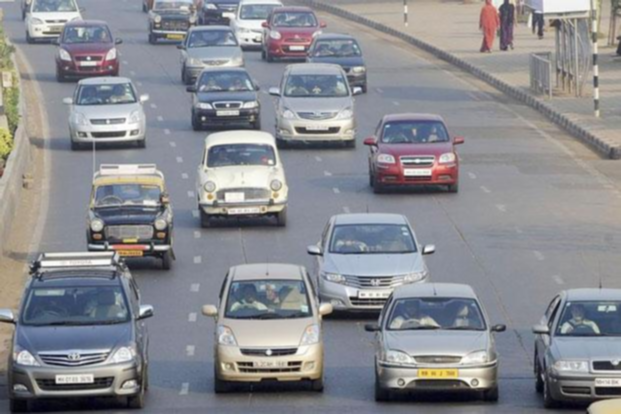

In [36]:
Blurred = cv2.GaussianBlur(src,(3,3),0)  #blurring with 3*3 kernerl.
cv2_imshow(Blurred)

#####Handling noise through medium filters, removing salt and pepper noise.


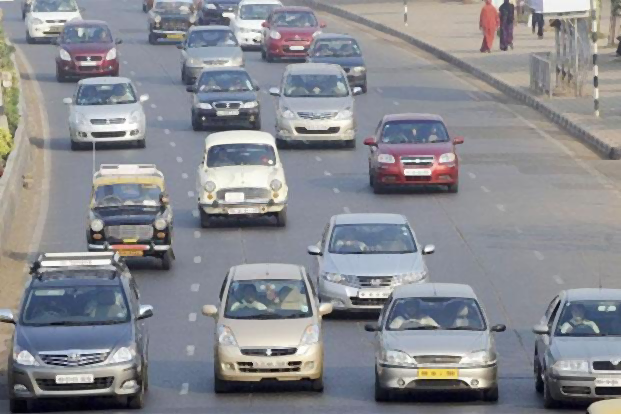

In [41]:
blur = cv2.medianBlur(src,3)
cv2_imshow(blur)

MedianBlur is better than GaussianBlur to remove noises as along with removing salt and pepper noise, it also preserves the edges which are useful in deep learning, image segmentation, foreground extraction etc.

####Image Visualization Techniques.

##### 1. Edge Detection Algorithms




###### 1. Sobel Edge Detection Algorithms


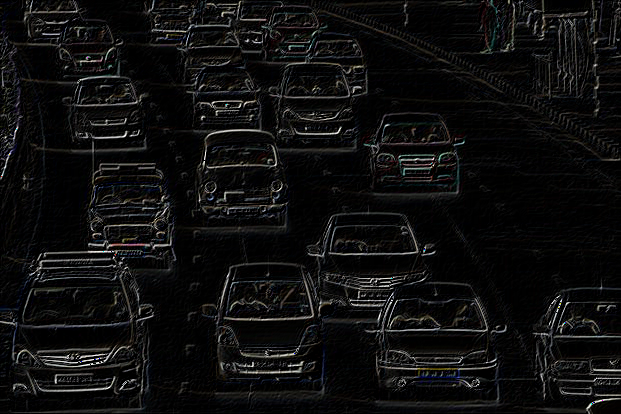

In [44]:

Sobelx= cv2.Sobel(src,-1,dx=0,dy=1,ksize=1,scale=1,delta=0,borderType=cv2.BORDER_DEFAULT)
Sobely= cv2.Sobel(src,-1,dx=1,dy=0,ksize=1,scale=1,delta=0,borderType=cv2.BORDER_DEFAULT)
sobel_final = Sobelx+Sobely
cv2_imshow(sobel_final)


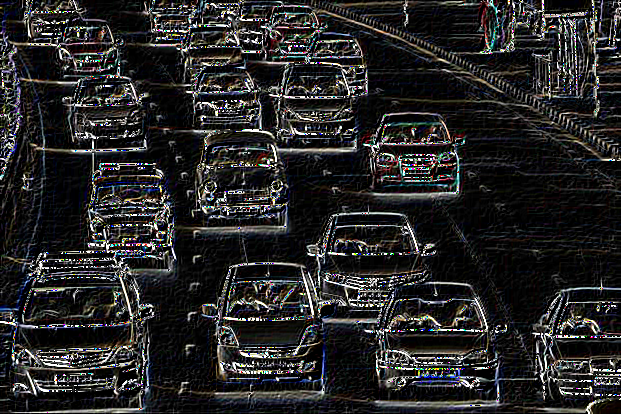

In [46]:

## Ksize is refers to the matrix that needs to be convulated (kernel)
## If we increase the ksize , we get following.
##The edges here are colored, we can change that by changing the "BorderType" parameter.

Sobelx= cv2.Sobel(src,-1,dx=0,dy=1,ksize=3,scale=1,delta=0,borderType=cv2.BORDER_DEFAULT)
Sobely= cv2.Sobel(src,-1,dx=1,dy=0,ksize=3,scale=1,delta=0,borderType=cv2.BORDER_DEFAULT)
sobel_final = Sobelx+Sobely
cv2_imshow(sobel_final)

###### 2. Laplacian Edge Detection Algorithms


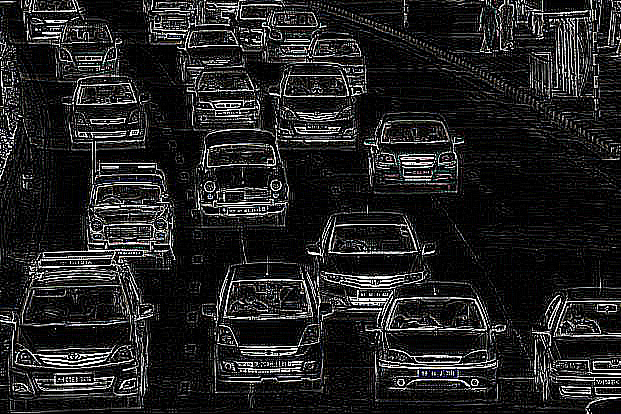

In [48]:
edges = cv2.Laplacian(src,-1,ksize=3,scale=1,delta=0,borderType=cv2.BORDER_DEFAULT)
cv2_imshow(edges)

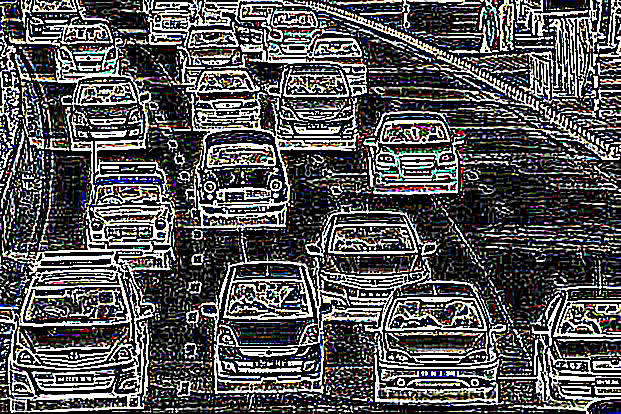

In [49]:
edges = cv2.Laplacian(src,-1,ksize=5,scale=1,delta=0,borderType=cv2.BORDER_DEFAULT)
cv2_imshow(edges)

###### 3. Scharr Edge Detection Algorithms


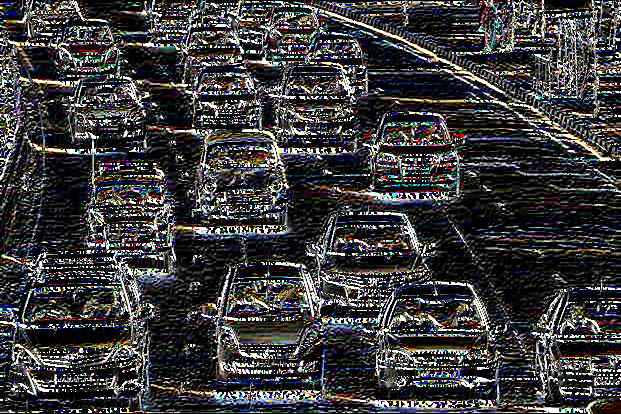

In [50]:
Scharrx= cv2.Scharr(src,-1,dx=0,dy=1,scale=1,delta=0,borderType=cv2.BORDER_DEFAULT)
Scharry= cv2.Sobel(src,-1,dx=1,dy=0,scale=1,delta=0,borderType=cv2.BORDER_DEFAULT)
Scharr_final = Scharrx+Scharry
cv2_imshow(Scharr_final)

###### 4. Canny Edge Detection Algorithms


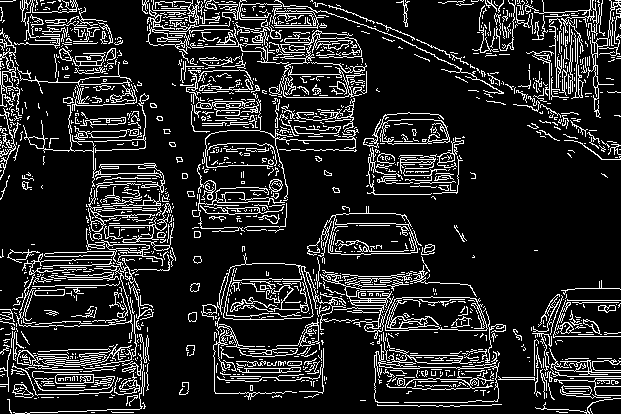

In [51]:
# A Gaussian Kernel of 5*5 size is applied to filter out any noise.
# Intensity gradient can be calculated using L1 or L2 norm.
# Non Max Suppression is applied.
# Using the gradient thresholds, the final edge set is calculated.

L1 = cv2.Canny(src,100,150,L2gradient=False)
cv2_imshow(L1)

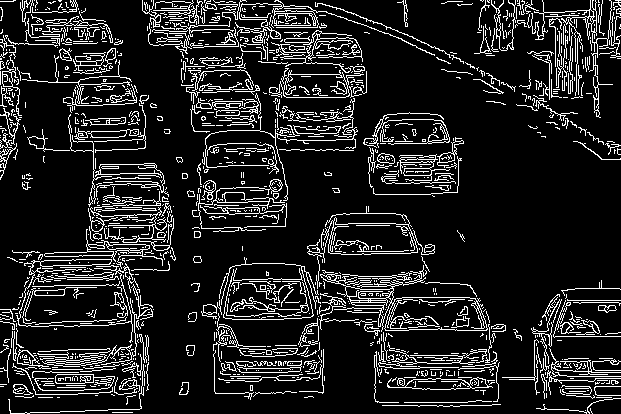

In [53]:
##L2 Gradient is expensive but actually more accurate 
L2 = cv2.Canny(src,100,150,L2gradient=True)
cv2_imshow(L2)

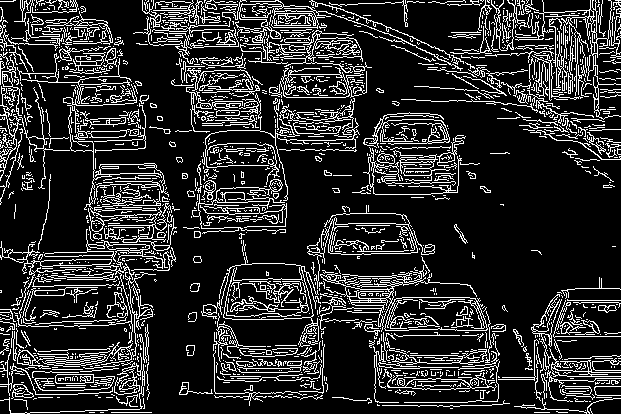

In [54]:
## Decreasing the gradient thresholds.
L2 = cv2.Canny(src,50,100,L2gradient=True)  
cv2_imshow(L2)

##### 2. Thresholding Conversions.


###### 1. BINARY_INV


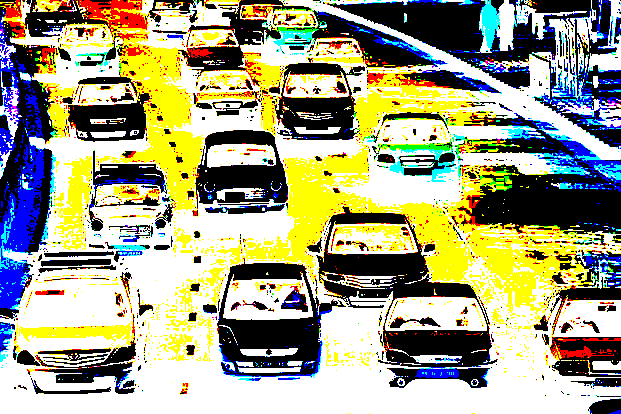

In [58]:
# Thresholding corresponds to setting a threshold for each pixel value.
# Thresholding the image by setting all pixel values less than 150 to their Binary_Inv
# and setting all the pixel values greater than 150 to 255(black)

Thresh = cv2.threshold(src, 150,255,cv2.THRESH_BINARY_INV)[1]
cv2_imshow(Thresh)

###### 2. BINARY_INV


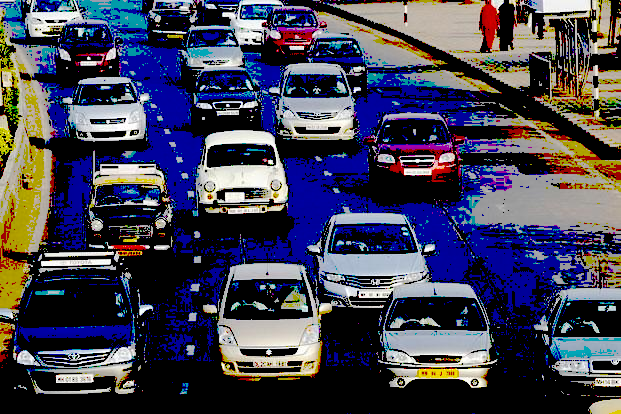

In [69]:
Thresh = cv2.threshold(src,150,250,cv2.THRESH_TOZERO)[1]
cv2_imshow(Thresh)


###### 3. Grayscale to Black and white.

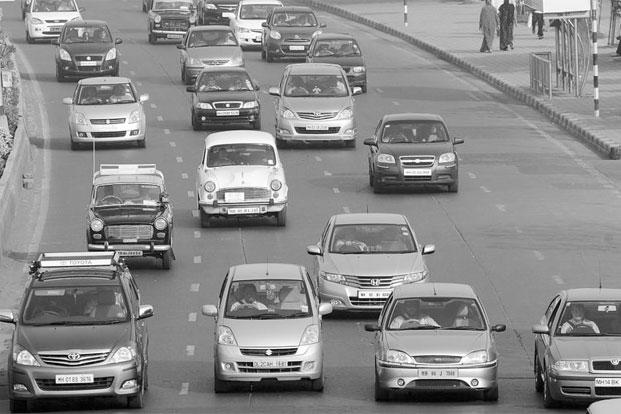

In [73]:
gray_img = cv2.imread("/content/Traffic.jpg",0)
cv2_imshow(gray_img)

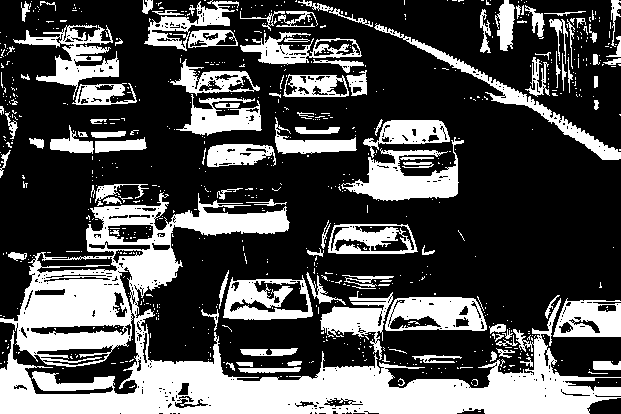

In [78]:
Thresh = cv2.threshold(gray_img,125,255,cv2.THRESH_BINARY_INV)[1]
cv2_imshow(Thresh)


##### 3. Morphological Operations.


###### 1. Erosion


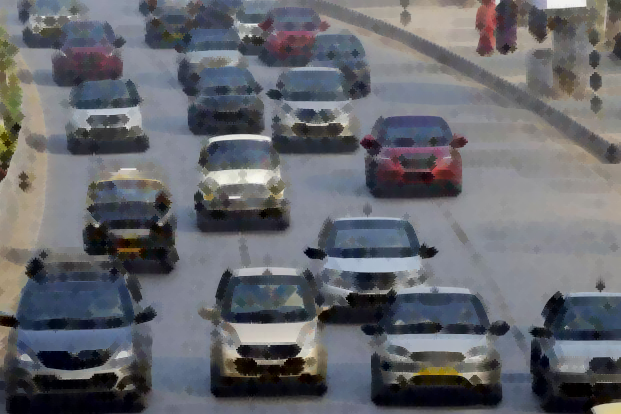

In [85]:
#We need to create a kernel for morphological Operations.
Kernel = cv2.getStructuringElement(cv2.MORPH_CROSS,(5,5))
#This creates a kernel matrix :-
'''
 0 0 1 0 0
 0 0 1 0 0
 1 1 1 1 1
 0 0 1 0 0
 0 0 1 0 0
'''
##This will erode the pixels according to parameters.
erosed = cv2.erode(src,Kernel,iterations=2)
cv2_imshow(erosed)

###### 2. Dialation


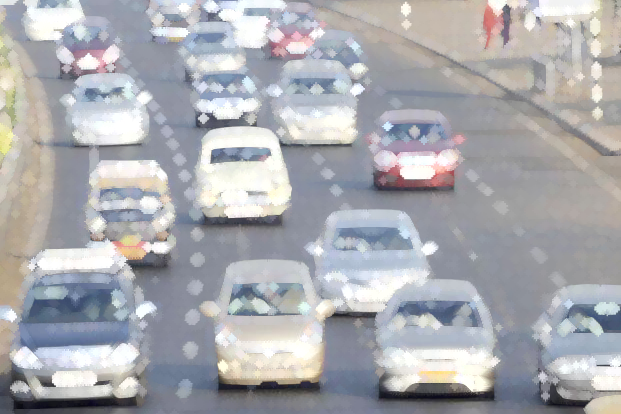

In [91]:
##This will dilate the pixels according to parameters.
dilated = cv2.dilate(src,Kernel,iterations=2)
cv2_imshow(dilated)

###### 3. Gradient


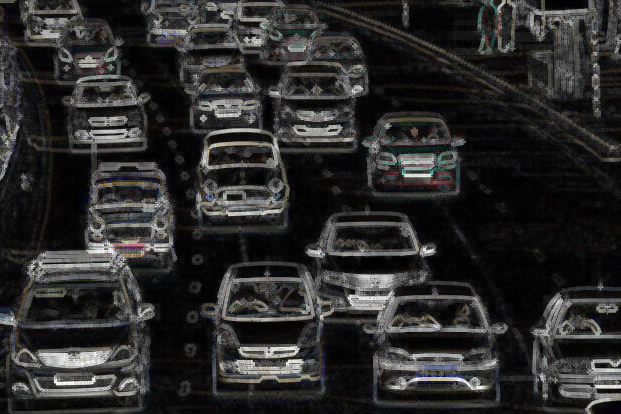

In [93]:
Gradient = cv2.morphologyEx(src,cv2.MORPH_GRADIENT,Kernel)
cv2_imshow(Gradient)

##### 4. K- MEANS Clustering Operation on a image.


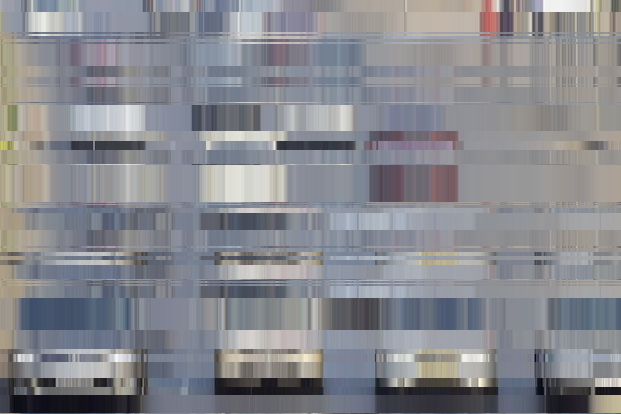

In [107]:
#Implementing K means on an image
Z=np.float32(src)

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)

ret,label,center=cv2.kmeans(Z,15,None,criteria,30,cv2.KMEANS_RANDOM_CENTERS)

center = np.uint8(center)
res = center[label.flatten()]
res2 = res.reshape((src.shape))

cv2_imshow(res2)


##### 5. Max RGB Filter



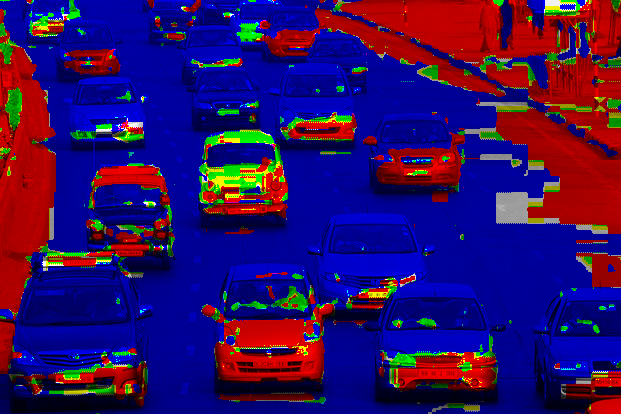

In [109]:
#Only the max channel among rgb is passed. 
(B,G,R) = cv2.split(src)
M= np.maximum(np.maximum(R,G),B)

R[R<M] =0
B[B<M] =0
G[G<M] =0

RgbFilter = cv2.merge((B,G,R))
cv2_imshow(RgbFilter)

##### 6. ColorMaps (Cmaps)


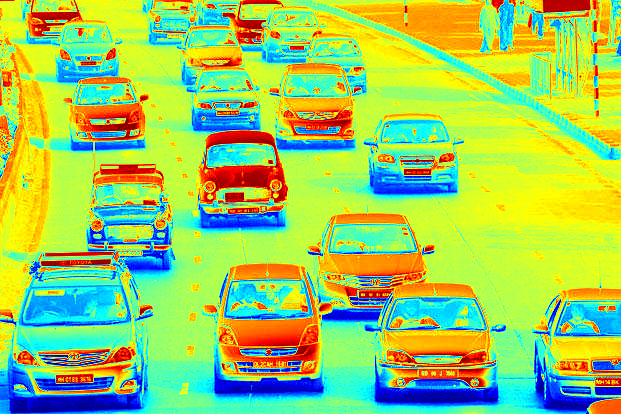

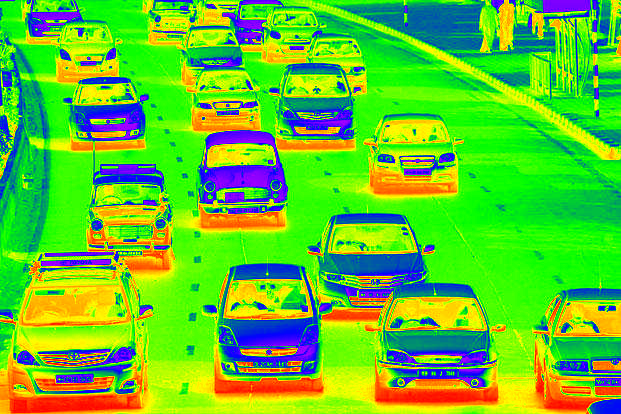

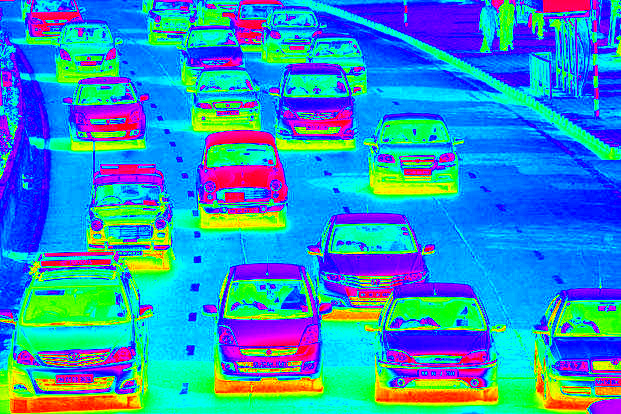

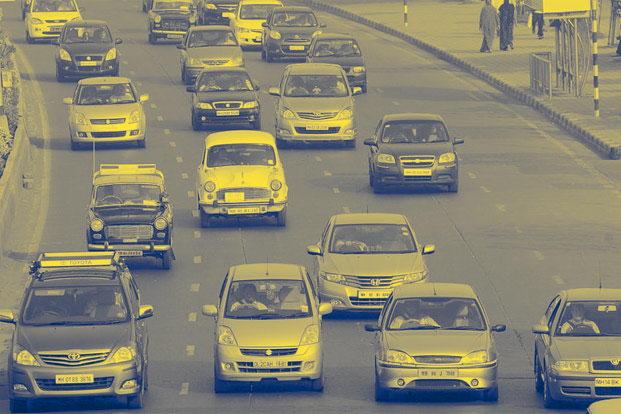

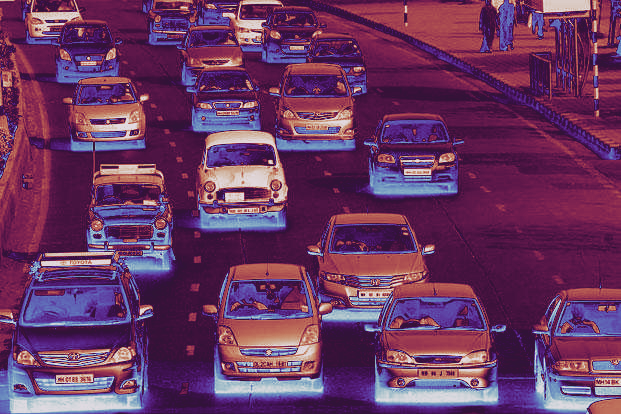

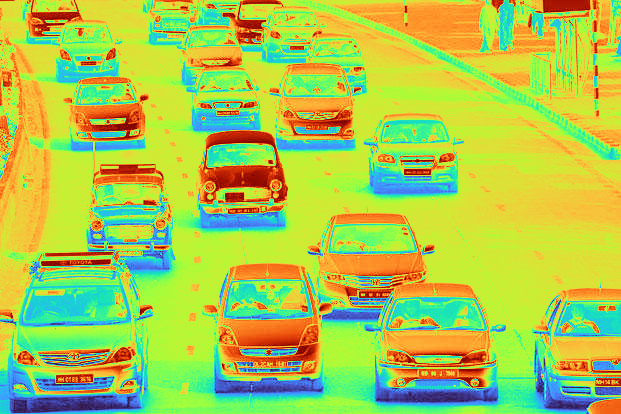

In [127]:
# There are various way to represent an image by using various colormaps
# which are pre built pixel conversion based on some standards.

imC = cv2.applyColorMap(src, cv2.COLORMAP_JET)
cv2_imshow(imC)

imC = cv2.applyColorMap(src, cv2.COLORMAP_RAINBOW)
cv2_imshow(imC)

imC = cv2.applyColorMap(src, cv2.COLORMAP_HSV)
cv2_imshow(imC)

imC = cv2.applyColorMap(src, cv2.COLORMAP_CIVIDIS)
cv2_imshow(imC)

imC = cv2.applyColorMap(src, cv2.COLORMAP_TWILIGHT)
cv2_imshow(imC)

imC = cv2.applyColorMap(src, cv2.COLORMAP_TURBO)
cv2_imshow(imC)


##### 7. SaliencyMaps 


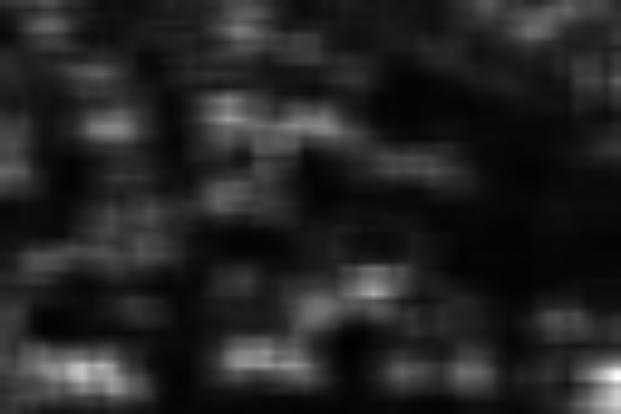

In [133]:
#Spectral Static Saliency

saliency = cv2.saliency.StaticSaliencySpectralResidual_create()
(ret, saliencyMap) = saliency.computeSaliency(src)
saliencyMap = (saliencyMap * 255).astype("uint8")
cv2_imshow(saliencyMap)


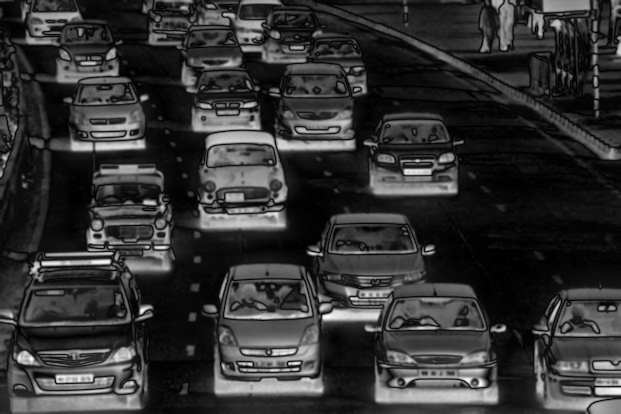

In [136]:
#Fine grained Saliency

saliency = cv2.saliency.StaticSaliencyFineGrained_create()
(ret , saliencyMap) = saliency.computeSaliency(src)
saliencyMap = (saliencyMap * 255).astype("uint8")
cv2_imshow(saliencyMap)

#### And various infinite other visualisations can be done by grouping two of the above techniques together. There are endless possibilities in how an image can be visualised.  We can perform various other visualisations, bitwise operations by taking two or more techniques, various other important algorithms, and it all comes down to what we really want to see. If we want to see edges, one way is to convert the image into grayscale, then perform edge detection algorithms, and then dialate or erode the edges to adjust their thickness and so on. It depends on the problem we are dealing with.